# Project 3

## This project is implemented by Cheng Yang and Yutong Jiang

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math

from scipy.stats import norm
from sklearn.mixture import GaussianMixture

import seaborn as sns
import random

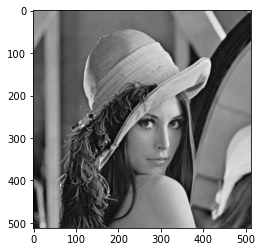

In [2]:
lena_original = plt.imread('lena_gray.bmp')
#lena_original is a 8-bit 512 * 512 array, the gray scale ranges from 0 - 255
plt.imshow(lena_original, cmap = 'gray')

# Code for RT-1 MRF-denoise

In [3]:
def quantize_image(image, quan_bit):
    dim_0 = image.shape[0]
    dim_1 = image.shape[1]
    image_quan = image.copy()
    interval = 255/(2 ** quan_bit - 1)
    for row in range(dim_0):
        for col in range(dim_1):
            image_quan[row][col] = np.round(np.round(image[row][col]/interval) * interval)
    return image_quan

In [4]:
def Gaussnoise_func(image, quan_bit, mean, var):

    dim_0 = image.shape[0]
    dim_1 = image.shape[1]
    
    image = image/255            
    noise = np.random.normal(mean, var ** 0.5, image.shape)   
    out = image + noise                                        

    out = np.clip(out, 0, 1.0) * 255

    image_noise = quantize_image(out, quan_bit)
            
    return image_noise

In [5]:
# Here is the MRF only for 1-bit model
# def cal_energy(image_noise, image_pred, row, col, h, beta, eta):
#     energy = h * image_pred[row][col] - beta * image_pred[row][col] * (image_pred[row - 1][col] + image_pred[row + 1][col] 
#             + image_pred[row][col - 1] + image_pred[row][col + 1]) - eta * image_pred[row][col] * image_noise[row][col]
#     return energy

# def MRF(image_noise, h, beta, eta):
#     dim_0 = image_noise.shape[0]
#     dim_1 = image_noise.shape[1]
#     binary_noiseim = np.where(image_noise == 0, -1, 1)
#     image_pred = binary_noiseim.copy()
    
#     for row in range(1, dim_0 - 1):
#         for col in range(1, dim_1 - 1):
#             image_pred[row][col] = -1
#             energy_n = cal_energy(binary_noiseim, image_pred, row, col, h, beta, eta)
#             image_pred[row][col] = 1
#             energy_p = cal_energy(binary_noiseim, image_pred, row, col, h, beta, eta)
#             if energy_n < energy_p:
#                 image_pred[row][col] = -1
#             else:
#                 image_pred[row][col] = 1
#     pred = np.where(image_pred == -1, 0, 255)
#     return pred

In [6]:
def cal_energy(image_noise, image_pred, row, col, h, beta, eta):
    
    bias = [-1, 1]
    tot_1 = 0
    tot_2 = 0
    
    for x_bias in bias:
        tot_1 += math.cos((image_pred[row][col] - image_pred[row + x_bias][col])/255)
    
    for y_bias in bias:
        tot_1 += math.cos((image_pred[row][col] - image_pred[row][col + y_bias])/255)
    
    tot_2 = math.cos((image_pred[row][col] - image_noise[row][col])/255)
     
    return h * image_pred[row][col] - beta * tot_1 - eta * tot_2

def MRF(image_noise, h, beta, eta):
    dim_0 = image_noise.shape[0]
    dim_1 = image_noise.shape[1]
    image_pred = image_noise.copy()
    gray_level = np.unique(image_noise)
    
    for row in range(1, dim_0 - 1):
        for col in range(1, dim_1 - 1):
            energy = []
            for idx in range(len(gray_level)):
                image_pred[row][col] = gray_level[idx]
                energy.append(cal_energy(image_noise, image_pred, row, col, h, beta, eta))
            image_pred[row][col] = gray_level[np.argmin(energy)]
    return image_pred


In [7]:
def calculate_mse(image_noise, original_image = lena_original):
    res = np.sum((image_noise - original_image) ** 2)/(512 * 512)
    return np.sqrt(res)

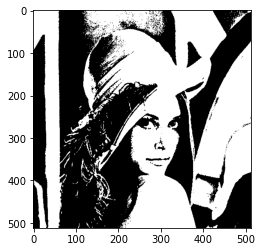

In [8]:
quan_bit = 1
image_1bit = quantize_image(lena_original, quan_bit)
plt.imshow(image_1bit, cmap = 'gray')

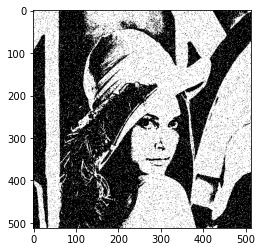

In [9]:
mean = 0
var = 0.1
image_noise = Gaussnoise_func(image_1bit, quan_bit, mean, var)
plt.imshow(image_noise, cmap = 'gray')

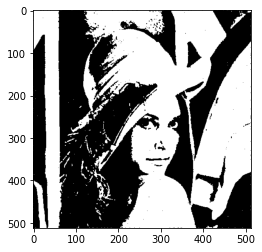

In [10]:
h = 0
beta = 2.0
eta = 1.5
pred = MRF(image_noise, h, beta, eta)
plt.imshow(pred, cmap = 'gray')

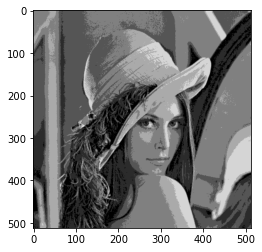

In [11]:
quan_bit = 3
image_3bit = quantize_image(lena_original, quan_bit)
plt.imshow(image_3bit, cmap = 'gray')

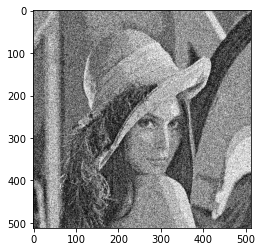

In [12]:
mean = 0
var = 0.04
image_noise_3bit = Gaussnoise_func(image_3bit, quan_bit, mean, var)
plt.imshow(image_noise_3bit, cmap = 'gray')

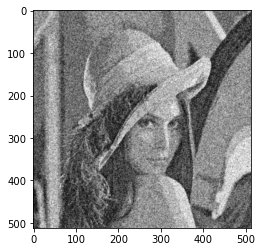

In [13]:
h = 0
beta = 2

eta = 2
pred_3bit = MRF(image_noise_3bit, h, beta, eta)
plt.imshow(pred_3bit, cmap = 'gray')

In [14]:
print(f'RMSE between noise and original image: {calculate_mse(image_noise_3bit, image_3bit)}')
print(f'RMSE between prediction(denoised) and original image: {calculate_mse(pred_3bit, image_3bit)}')

RMSE between noise and original image: 49.697698119986335
RMSE between prediction(denoised) and original image: 24.78850604087066


# Code for RT-2

In [15]:
#Here is the function to add noise on 8-bit image
def make_noise(image, mean, var):
    noise = np.random.normal(mean, var ** 0.5, image.shape)
    out = np.round(image + noise)
    out = np.clip(out, 0, 255)
    return out

In [16]:
def image_to_chain(image, dim):
    
    length = image.shape[0]
    
    if dim == 0: 
        chain = image.reshape(1, -1)[0]
    
    if dim == 1:
        chain = image.T.reshape(1, -1)[0]
    
    return chain

In [17]:
def chain_to_image(chain, dim):
    
    length = np.sqrt(len(chain)).astype(int)
    if dim == 0:
        image = chain.reshape(length, length)
    
    if dim == 1:
        image = chain.reshape(length, length).T
    
    return image

In [18]:
def get_prior(mean, var, dim):
    '''
    calculate P(y(k)|x(k))
    '''
    prob = np.zeros((dim, dim))
    position = [i for i in range(0, 256)]
    for i in range(dim):
        prob[i, :] = norm.pdf(position, i, var ** 0.5)
    return prob

In [19]:
def get_factor_prob(chain):
    
    '''
    calculate P(x(k)|x(k - 1))
    '''
    
    chain = chain.astype(int)
    length = 256
    cnt = np.zeros((length, length))
    
    #calculate histogram
    for i in range(1, length ** 2):
        cnt[chain[i], chain[i - 1]] += 1
    
    prob = cnt.copy()
    prob = prob.astype(float)
    for i in range(length):
        prob[i, :] = prob[i, :]/(np.sum(prob[i, :]))
    
    return prob

In [20]:
mean = 0
var = 625
dsize = 256
noisy_image = make_noise(lena_original, mean, var)

In [21]:
def viterbi(y, A, B, Pi):
    """
    Steps for viterbi algorithm
    y : Observation state sequence. int dtype.
    A : State transition matrix.
    B : Emission matrix.
    Pi: Initial state probabilities
    """
    K = A.shape[0]
    T = len(y)
    T1 = np.zeros((K, T))
    T2 = np.zeros((K, T))

    T1[:, 0] = Pi * B[:, y[0]]
    T1[:, 0] = T1[:, 0]/(np.sum(T1[:, 0]))
    T2[:, 0] = 0

    for i in range(1, T):
        T1[:, i] = np.max(T1[:, i - 1] * A.T * B[np.newaxis, :, y[i]].T, 1)
        T1[:, i] = T1[:, i]/(np.sum(T1[:, i]))
        T2[:, i] = np.argmax(T1[:, i - 1] * A.T, 1)

    x = np.zeros(T)
    x[-1] = np.argmax(T1[:, T - 1])
    x = x.astype(int)
    for i in reversed(range(1, T)):
        x[i - 1] = T2[x[i], i]

    return x, T1, T2

In [22]:
chain = image_to_chain(noisy_image, 0).astype(int)
prob_x = get_factor_prob(chain) # get the probability of x_k|x_{k - 1}
prob_y = get_prior(mean, var, dsize) # get the probability of y_k|x_k

state_s = [i for i in range(256)]

img_res = np.zeros((512, 512))
for i in range(512):
    obs_s = noisy_image[i, :]
    start_prob = np.zeros(256)
    start_prob[int(noisy_image[i, 0])] = 1
    transition_prob = prob_x
    emission_prob = prob_y
    obs_s = obs_s.astype(int)
    x, T1, T2 = viterbi(obs_s, transition_prob.T, emission_prob, start_prob)
    img_res[i, :] = x

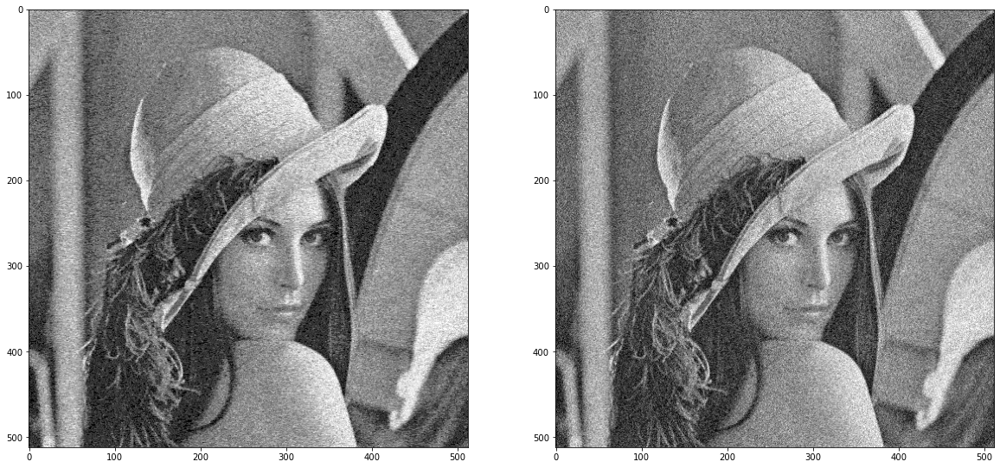

In [23]:
plt.subplots(figsize = (20, 20))
plt.subplot(121)
plt.imshow(img_res, cmap = 'gray')
plt.subplot(122)
plt.imshow(noisy_image, cmap = 'gray')

In [24]:
print(f'RMSE between noise and original image: {calculate_mse(noisy_image)}')
print(f'RMSE between prediction(denoised) and original image: {calculate_mse(img_res)}')

RMSE between noise and original image: 24.886940931922
RMSE between prediction(denoised) and original image: 22.222969523686153


# Code for RT-3

In [25]:
def calculate_Gaussian_P(xn, u, var):
    """
    input: 3 scalar
    """
    return (1/np.sqrt(2*math.pi*var))*np.exp(-(xn - u)**2/2/var)

def calculate_gamma(X, u, var, pi):
    """
    input: 
        X: array, (N, 1)
        u, var, pi: array, (K, 1)
    return:
    gamma: (N, K) array
    """
    gamma = np.zeros((len(X), len(u)))
    for k in range(len(u)):
        for n in range(len(X)):
            sum = 0
            for j in range(len(u)):
                sum += pi[j] * calculate_Gaussian_P(X[n], u[j], var[j])
            gamma_nk = pi[k] * calculate_Gaussian_P(X[n], u[k], var[k])/sum
            gamma[n, k] = gamma_nk
    return gamma

def calculate_log_p(X, u, var, pi):
    log_p = 0
    for n in range(len(X)):
        pn = 0
        for k in range(len(u)):
            pn += pi[k] * calculate_Gaussian_P(X[n], u[k], var[k])
        log_p += np.log(pn)
    return log_p

In [26]:
def GMM(X, K):
    """
    input: 
        X: (N, 1) array
        K: scalar, number of klusters
    """
    N = len(X)
    interval = np.round(100/(K+1)).astype(int)
    u_per = [i for i in range(interval, interval*K+1, interval)]
    u = np.percentile(X, u_per)
    var = np.ones(K) * 30.0
    pi = np.ones(K)/K
    log_p_last = calculate_log_p(X, u, var, pi)

    for round in range(10):
        # Estep:
        gamma = calculate_gamma(X, u, var, pi)
        # M-step:
        for k in range(K):
            gamma_k = gamma[:, k]
            Nk = gamma_k.sum()
            u_new = (gamma_k * X).sum() / Nk
            u[k] = u_new
            xn_uk = X - np.ones(N)*u_new
            var[k] =  (gamma_k * xn_uk *xn_uk).sum() / Nk
            pi[k] = Nk/N
        log_p = calculate_log_p(X, u, var, pi)  
        if log_p < log_p_last * 0.999:
            break
        log_p_last = log_p
    
    prob = calculate_gamma(X, u, var, pi)
    res = np.argmax(prob, 1)
    return np.round(u[res])

In [27]:
size = 8
n_block = int(512/size)
tmp_list_our = []
#image_tmp_res = noisy_image.copy()
component_set = [i for i in range(2, 4)]

for n in range(len(component_set)):
    image_tmp_res = noisy_image.copy()
    for i in range(n_block):
        for j in range(n_block):
            tmp = noisy_image[i * size : (i + 1) * size, j * size : (j + 1) * size]
            tmp_chain = image_to_chain(tmp, 0).reshape(1, -1)[0]
            #gm = GaussianMixture(component_set[n], random_state=0).fit(tmp_chain)
            #gm_means = gm.means_
            #pred_tmp = gm.predict(tmp_chain)
            #pred_level = np.round(gm_means[pred_tmp])
            estimate = GMM(tmp_chain, component_set[n])
            #image = chain_to_image(pred_level.reshape(1, -1)[0], 0)
            image = chain_to_image(estimate, 0)
            image_tmp_res[i * size : (i + 1) * size, j * size : (j + 1) * size] = image
    print(calculate_mse(image_tmp_res))
    tmp_list_our.append(image_tmp_res)

19.269877092160517
20.847673267102387


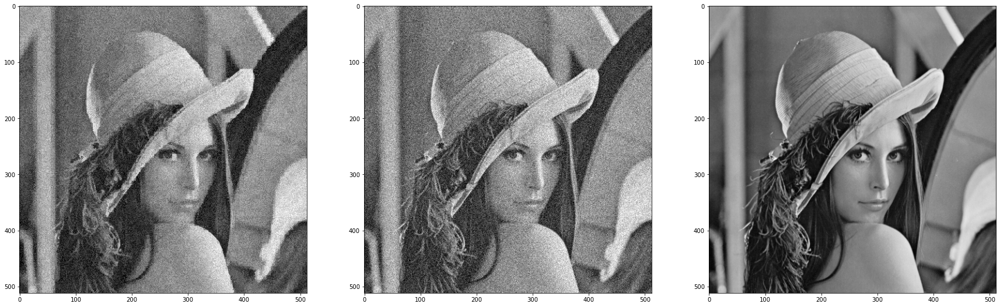

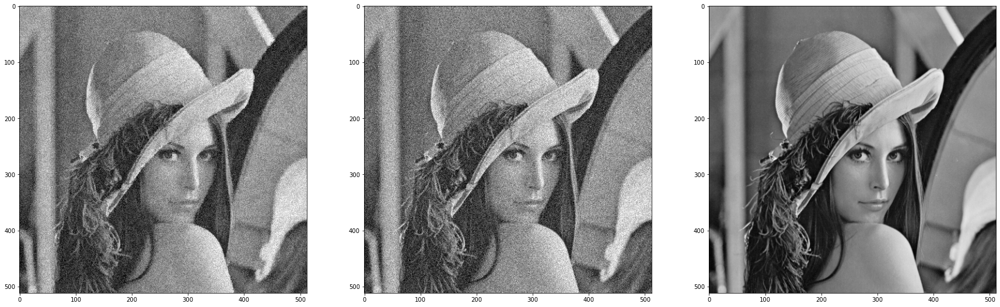

In [28]:
for n in range(0, len(tmp_list_our)):
    plt.figure(figsize = (30, 30))
    plt.subplot(1, 3, 1)
    plt.imshow(tmp_list_our[n], cmap = 'gray')
    plt.subplot(1, 3, 2)
    plt.imshow(noisy_image, cmap = 'gray')
    plt.subplot(1, 3, 3)
    plt.imshow(lena_original, cmap = 'gray')

In [29]:
size = 8
n_block = int(512/size)
tmp_list = []
#image_tmp_res = noisy_image.copy()
component_set = [i for i in range(2, 4)]

for n in range(len(component_set)):
    image_tmp_res = noisy_image.copy()
    for i in range(n_block):
        for j in range(n_block):
            tmp = noisy_image[i * size : (i + 1) * size, j * size : (j + 1) * size]
            tmp_chain = image_to_chain(tmp, 0).reshape(-1, 1)
            gm = GaussianMixture(component_set[n], random_state=0).fit(tmp_chain)
            gm_means = gm.means_
            pred_tmp = gm.predict(tmp_chain)
            pred_level = np.round(gm_means[pred_tmp])
            image = chain_to_image(pred_level.reshape(1, -1)[0], 0)
            image_tmp_res[i * size : (i + 1) * size, j * size : (j + 1) * size] = image
    print(calculate_mse(image_tmp_res))
    tmp_list.append(image_tmp_res)

18.355048110470737
21.118778554101738


In [30]:
bias_list = [-1, 1]
res_list = []
for i in range(len(tmp_list)):
    res = tmp_list[i].copy()
    for row in range(1, 511):
        for col in range(1, 511):
            dic = {}
            for bias in bias_list:
                if res[row + bias][col] in dic:
                    dic[res[row + bias][col]] += 1
                #if res[row + bias][col] not in dic:
                else:
                    dic[res[row + bias][col]] = 1
                if res[row][col + bias] in dic:
                    dic[res[row][col + bias]] += 1
                #if res[row][col + bias] not in dic:
                else:
                    dic[res[row][col + bias]] = 1
            if res[row][col] in dic:
                dic[res[row][col]] += 2
            #if res[row][col] not in dic:
            else:
                dic[res[row][col]] = 2
            res[row][col] = (max(dic, key = dic.get))
    res_list.append(res)

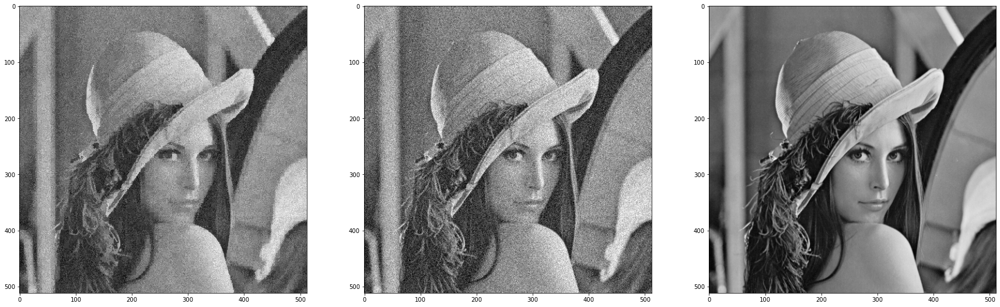

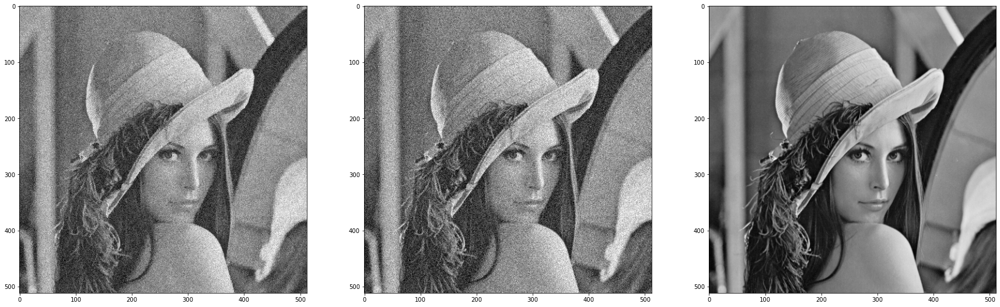

In [31]:
for n in range(0, len(tmp_list)):
    plt.figure(figsize = (30, 30))
    plt.subplot(1, 3, 1)
    plt.imshow(tmp_list[n], cmap = 'gray')
    plt.subplot(1, 3, 2)
    plt.imshow(noisy_image, cmap = 'gray')
    plt.subplot(1, 3, 3)
    plt.imshow(lena_original, cmap = 'gray')

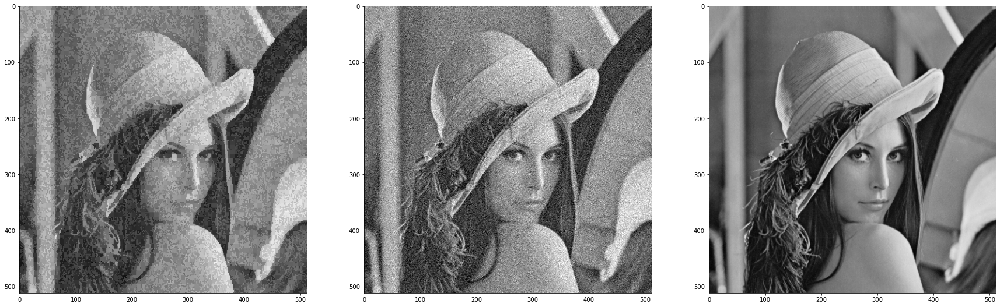

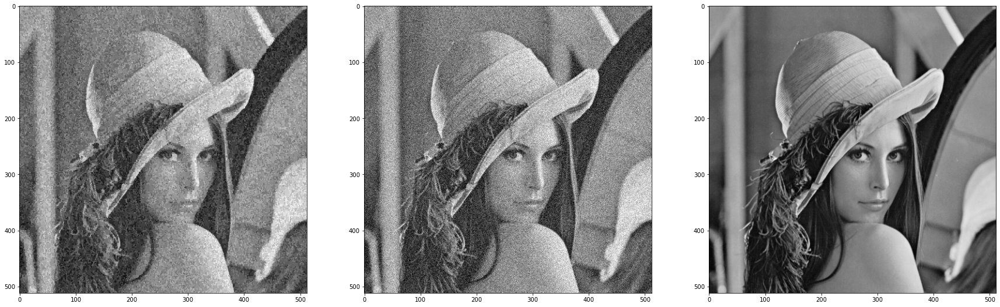

In [32]:
for n in range(0, len(res_list)):
    plt.figure(figsize = (30, 30))
    plt.subplot(1, 3, 1)
    plt.imshow(res_list[n], cmap = 'gray')
    plt.subplot(1, 3, 2)
    plt.imshow(noisy_image, cmap = 'gray')
    plt.subplot(1, 3, 3)
    plt.imshow(lena_original, cmap = 'gray')

In [33]:
print(f'RMSE between noise and original image: {calculate_mse(noisy_image)}')
print(f'RMSE between prediction(denoised) and original image when component = 2 in our GMM: {calculate_mse(tmp_list_our[0])}')
print(f'RMSE between prediction(denoised) and original image when component = 3 in our GMM: {calculate_mse(tmp_list_our[1])}')
print(f'RMSE between prediction(denoised) and original image when component = 2 in predefined GMM: {calculate_mse(tmp_list[0])}')
print(f'RMSE between prediction(denoised) and original image when component = 3 in predefined GMM: {calculate_mse(tmp_list[1])}')

RMSE between noise and original image: 24.886940931922
RMSE between prediction(denoised) and original image when component = 2 in our GMM: 19.269877092160517
RMSE between prediction(denoised) and original image when component = 3 in our GMM: 20.847673267102387
RMSE between prediction(denoised) and original image when component = 2 in predefined GMM: 18.355048110470737
RMSE between prediction(denoised) and original image when component = 3 in predefined GMM: 21.118778554101738
